# Alzheimer prediction using gray matter density from T1w MRI 

**Deadline**: Upload this notebook (rename it as 'TP4-Trees-YOUR-SURNAME.ipynb') with your answers and code to the Moodle/Ecampus before the deadline.


We will use a dataset composed of neuroimaging features from brain T1w MR images of 752 subjects, 416 controls and 336 with Alzheimer’s disease. Following the pipeline described in [1], all images are first normalized to a
common space, providing a voxel-wise correspondence across subjects. Then, gray matter density is computed at each voxel and averaged over a set of ROIs (Region of Interest) of an atlas, at the beginning you will use the [AAL2 atlas](http://www.gin.cnrs.fr/en/tools/aal/). Data comes from several freely available datasets, like [ADNI](http://adni.loni.usc.edu/) and [OASIS](https://www.oasis-brains.org/), and has been pre-processed by the [Clinica](http://www.clinica.run/) team using the procedure explained in [1].

Please load the data from the file: *dataTP.npz* where *T1xxxx* is a matrix containing the averaged density (each row is a subject and each column a feature), *y* is a vector containing the diagnosis (0 for controls and 1 for Alzheimer’s patients) and *ROIlabelsx* contains the name of the ROI of each feature. Here, *x* can take the name of the three atlases you have at your disposal: AAL2, [AICHA](http://www.gin.cnrs.fr/fr/outils/aicha/), [HAMMERS](https://brain-development.org/brain-atlases/adult-brain-atlases/).

**Reference**:
[1] J. Samper-González, N. Burgos, S. Bottani, S. Fontanella, P. Lu, A. Marcoux, A. Routier, J. Guillon, M. Bacci, J. Wen, A. Bertrand, H. Bertin, M.-O. Habert, S. Durrleman, T. Evgeniou, O. Colliot. *Reproducible evaluation of classification methods in Alzheimer's disease: framework and application to MRI and PET data*. NeuroImage, 2018 

In [1]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
import warnings
warnings.filterwarnings('ignore', category=ImportWarning)

# Libraries
import numpy as np
import matplotlib.pyplot as plt
###!pip install -q nilearn
from nilearn import plotting
%matplotlib inline
np.random.seed(seed=666)

from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier



In [2]:
from google_drive_downloader import GoogleDriveDownloader as gdd
gdd.download_file_from_google_drive(file_id='11cQmPm64k3T7ml5fPLetZgb1j1AjHBH8',
dest_path='./dataTP.npz')
gdd.download_file_from_google_drive(file_id='1S7e5IrPygE4VV0JTwqJIlyO2S_NhsiI4',
dest_path='./AtlasAAL2.nii')
gdd.download_file_from_google_drive(file_id='1E0pu5jIMpgcs2DQ8lBGWliwEBZvKrnV9',
dest_path='./AtlasAICHA.nii')
gdd.download_file_from_google_drive(file_id='1yltKwULrkHYh79RAh_zAg08r8pQMjRlQ',
dest_path='./AtlasHAMMERS.nii')

with np.load('./dataTP.npz',allow_pickle=True) as data:
    T1AAL2 = data['T1AAL2'] # data from AAL2 Atlas
    T1AICHA = data['T1AICHA'] # data from AICHA Atlas
    T1HAMMERS = data['T1HAMMERS'] # data from HAMMERS Atlas  
    y = data['y'] # classes, 0 for controls and 1 for patients    
    ROIlabelsAAL2 = data['ROIlabelsAAL2'] # labels for ROIs of atlas AAL2 
    ROIlabelsAICHA = data['ROIlabelsAICHA']    # labels for ROIs of atlas AICHA 
    ROIlabelsHAMMERS = data['ROIlabelsHAMMERS']    # labels for ROIs of atlas HAMMERS 

In [3]:
# Choose Atlas (here AAL2)
X=T1AAL2 # T1AAL2, T1AICHA, T1HAMMERS
labels=ROIlabelsAAL2 # ROIlabelsAAL2, ROIlabelsAICHA, ROIlabelsHAMMERS
atlas='./AtlasAAL2.nii' #AtlasAAL2.nii, AtlasAICHA.nii, AtlasHAMMERS.nii

N,M = X.shape # number subjects and ROIs
class_names = ["control","alzheimer"] # y=0, y=1

print('Number of controls and Alzheimer patients is respectively: {0} and {1}'.format(N-np.sum(y), np.sum(y)))
print('Number of ROI (features) is: {0}'.format(M))

Number of controls and Alzheimer patients is respectively: 416.0 and 336.0
Number of ROI (features) is: 120


Using the library nilearn we can also plot the atlas used to define the ROIs:

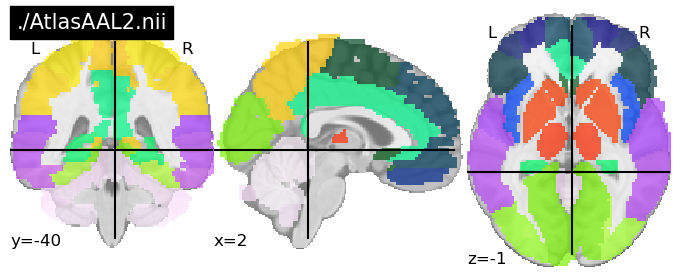

In [4]:
plotting.plot_roi(atlas, title=atlas)
plotting.show()

In this TP we will use Decision Trees, Bagging and Random Forests. Let's start with Decision Trees. First of all, we need to create a training and test set.

In [5]:
# Create training and test set
X_train, X_test, y_train, y_test = train_test_split(X, np.ravel(y), test_size=0.25)

And then we need to check whether out features need to be standardized or normalized. Let's have a look at them. Remember that if features can have both negative and positive values, as a rule of thumb, they should be standardized. If they only have positive values, a normalization is usually used. 

As already said, please remember that you should learn the standardization/normalization (namely learn the average/std or the max/min values) ONLY in the training set and then use the same values also in the test set. You should NOT use the entire dataset (both training and test) for standardization/normalization. Otherwise, you would have a *data leakage*, namely you would use data (the test set) that you should not use during training. 

0.0


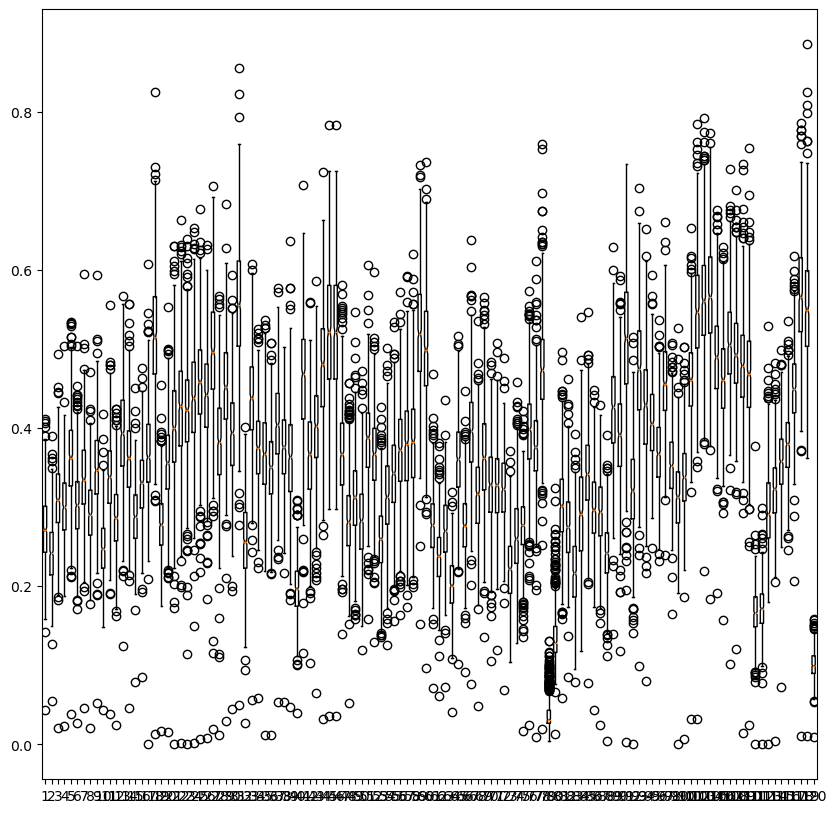

In [6]:
plt.figure(figsize=(10,10))
plt.boxplot(X,notch=True);

print(np.min(X)) # Since this value is non-negative we will only normalize.
# Otherwise (if it had negative values) we would need to standardize
# The standadiation allows us to have neg values, it just performs z = (x - u)/sigma
# Normalization keeps it between 0 and 1 (MinMaxScaler)
# Standardization/Normalization

from sklearn.preprocessing import StandardScaler, MinMaxScaler

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

Then, we can fit a Decision tree, with the default setting, using the following code:

In [7]:
# Fitting Decision Trees 
Tree = DecisionTreeClassifier(random_state=0)
Tree.fit(X_train,y_train)
# Score in the training set
print('Score in the training set is {0}'.format(Tree.score(X_train,y_train)) )
# Score in the test set
print('Score in the test set is {0}'.format(Tree.score(X_test,y_test)) )

Score in the training set is 1.0
Score in the test set is 0.7606382978723404


Instead than using the default hyperparameters, we could also look for the best ones. Among the hyperparameters implemented in *scikit-learn* we could use *'min_samples_split'*, the minimum number of samples required to split an internal node, and/or *'min_samples_leaf'*, the minimum number of samples required to be present at a leaf node. A split point at any depth will only be considered if it leaves at least min_samples_leaf training samples in each of the left and right branches. 

Plot the training and test score for different values of 'min_samples_split' (for instance between 2 and 15) WITHOUT using Cross Validation. Do the same for 'min_samples_leaf'.

**Question:** What is the best value ? What happens if you split differently your data (change `random_state` in the function `train_test_split`) ? 


**Answer:** The best value changes accordingly to our data split, although apparently the best min_samples_split and the best min_samples_leaf kept being 2 for all splits I tested. This is explainable since the increase in min_samples_split and min_samples_leaf tends to decrease the variance of the model. The decrease in the variance of the model tends to decrease the test score.

The value of min_samples_split that maximizes the training score is :  2
The value of min_samples_split that maximizes the test score is :  2


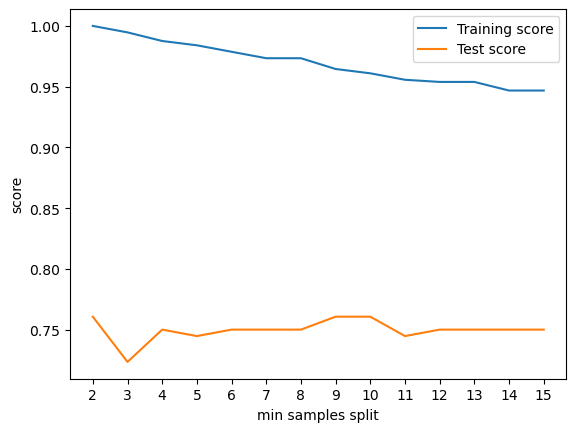

In [8]:
# min_samples_split
def get_samples_split():
    TTest=[]
    TTrain=[]
    for i in range(2,16):
        Tree = DecisionTreeClassifier(min_samples_split=i, random_state=0)
        Tree.fit(X_train, y_train)
        scoreTrain=Tree.score(X_train, y_train)
        scoreTest=Tree.score(X_test, y_test)
        TTrain.append(scoreTrain)
        TTest.append(scoreTest)
    plt.plot(TTrain,label='Training score');
    plt.xticks(np.arange(14), ('2', '3', '4', '5', '6','7','8','9','10','11','12','13','14','15'))
    print("The value of min_samples_split that maximizes the training score is : ",TTrain.index(max(TTrain))+2)
    plt.plot(TTest,label='Test score');
    plt.xticks(np.arange(14), ('2', '3', '4', '5', '6','7','8','9','10','11','12','13','14','15'))
    plt.xlabel('min samples split')
    plt.ylabel('score')
    print("The value of min_samples_split that maximizes the test score is : ",TTest.index(max(TTest))+2)
    plt.legend();

get_samples_split()

The value of min_samples_leaf that maximizes the training score is :  2
The value of min_samples_leaf that maximizes the test score is :  9


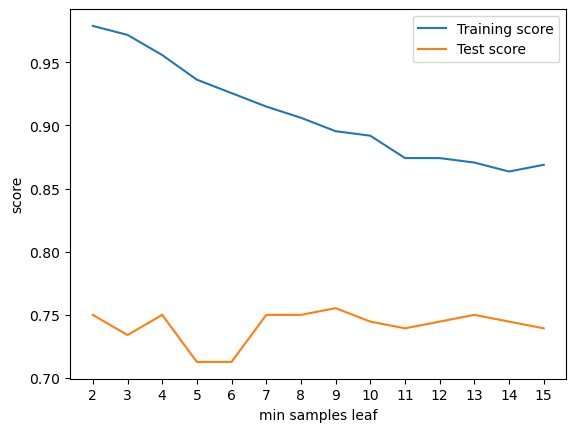

In [9]:
# min_samples_leaf
def get_samples_leaf():
    TTest=[]
    TTrain=[]
    for i in range(2,16):
        Tree = DecisionTreeClassifier(min_samples_leaf=i, random_state=0)
        Tree.fit(X_train, y_train)
        scoreTrain=Tree.score(X_train, y_train)
        scoreTest=Tree.score(X_test, y_test)
        TTrain.append(scoreTrain)
        TTest.append(scoreTest)
    plt.plot(TTrain,label='Training score');
    plt.xticks(np.arange(14), ('2', '3', '4', '5', '6','7','8','9','10','11','12','13','14','15'))
    print("The value of min_samples_leaf that maximizes the training score is : ",TTrain.index(max(TTrain))+2)
    plt.plot(TTest,label='Test score');
    plt.xticks(np.arange(14), ('2', '3', '4', '5', '6','7','8','9','10','11','12','13','14','15'))
    plt.xlabel('min samples leaf')
    plt.ylabel('score')
    print("The value of min_samples_leaf that maximizes the test score is : ",TTest.index(max(TTest))+2)
    plt.legend();

get_samples_leaf()

In [10]:
# Create training and test set
X_train, X_test, y_train, y_test = train_test_split(X, np.ravel(y), test_size=0.25, random_state=57)

The value of min_samples_leaf that maximizes the training score is :  2
The value of min_samples_leaf that maximizes the test score is :  12


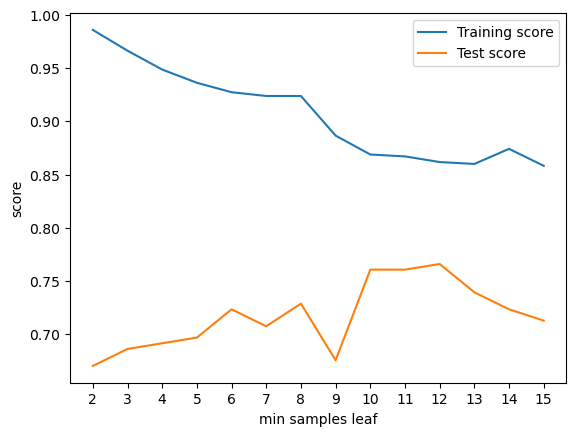

In [11]:
get_samples_leaf()

The value of min_samples_split that maximizes the training score is :  2
The value of min_samples_split that maximizes the test score is :  2


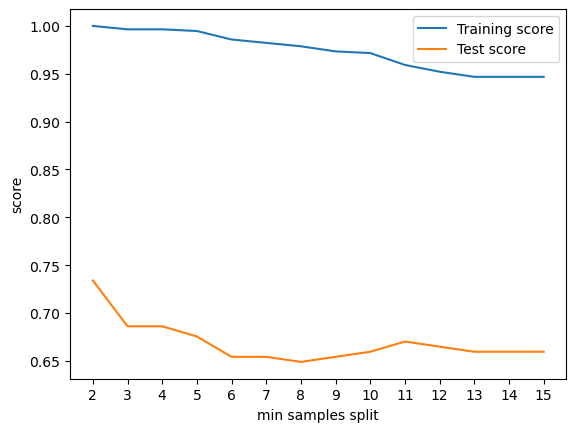

In [12]:
get_samples_split()

Try to add Gaussian noise to the data (using for instance zero mean and 0.05 for $\sigma$) and, using the best hyperparameters found before in the test set (you can use both `min_samples_leaf` and `min_samples_split`), look at the test score. Repeat this process several times and compare the results with the score obtained without adding noise. 

**Question**: Are the results stable ? Hint: you could use for instance *noise = np.random.normal(mu, sigma)* if you have standardized the features and *noise = np.abs(np.random.normal(mu, sigma))* if you have normalized them (we use *np.asb()* to take only positive values and $\sigma$ should be small in order to (almost) preserve the range of the features between 0 and 1)

No, the results aren't stable.

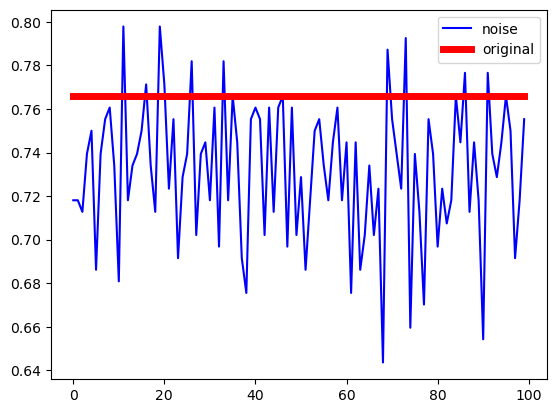

In [13]:
Tree = DecisionTreeClassifier(min_samples_split=12,min_samples_leaf=12,random_state=0)
scoreTestnoise=np.zeros(100)
scoreTest=np.zeros(100)

Tree.fit(X_train, y_train)
scoreTest[:] = Tree.score(X_test,y_test)  

for k in range(100):    
    X_train_temp=np.copy(X_train)
    for i in range(X_train.shape[0]):
        X_train_temp[i] = np.abs(X_train_temp[i] + np.random.normal(0, 0.05)) # The data is only positive
        
    Tree.fit(X_train_temp, y_train)
    scoreTestnoise[k] = Tree.score(X_test, y_test)
    
plt.plot(scoreTestnoise,'b',label='noise')
plt.plot(scoreTest,'r',linewidth=5.0,label='original')       
plt.legend()

To plot decision trees, we can also use the *graphviz* library. If you need to install it locally, you can do it using *conda install python-graphviz*. 
 

First plot the tree learnt on the original data, witout adding noise.

In [14]:
from matplotlib import image as plt_image

def showGraph(graph):
    graph.format = 'png'
    graph.view()
    img = plt_image.imread('Source.gv.png')
    ratio = img.shape[0] / img.shape[1] # h/w
    w = 50
    h = w * ratio
    fig, ax = plt.subplots(figsize=(h, w), dpi=120)
    ax.imshow(img)

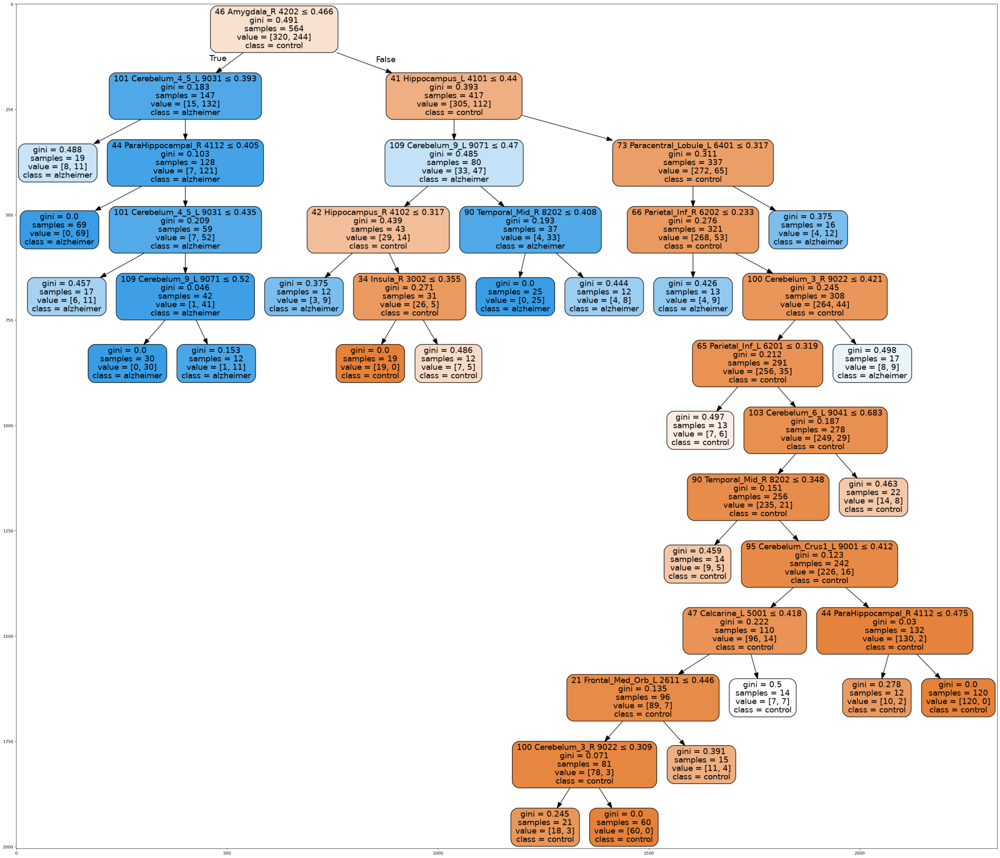

In [15]:
import graphviz 

Tree.fit(X_train,y_train)
dot_data = tree.export_graphviz(Tree, out_file=None,feature_names=labels,class_names=class_names,filled=True, rounded=True,special_characters=True)
graph = graphviz.Source(dot_data)
showGraph(graph)

Now, plot the tree learnt on noisy data.

**Question**: Is it the same ? You can try several times, for different levels of noise. Comment the results

**Answer:** As expected it's not the same, we can see that as much as we add the noise we get to a more diferent graph


(eog:13191): EOG-CRITICAL **: 14:15:24.654: eog_job_thumbnail_cb: assertion 'EOG_IS_LIST_STORE (data)' failed


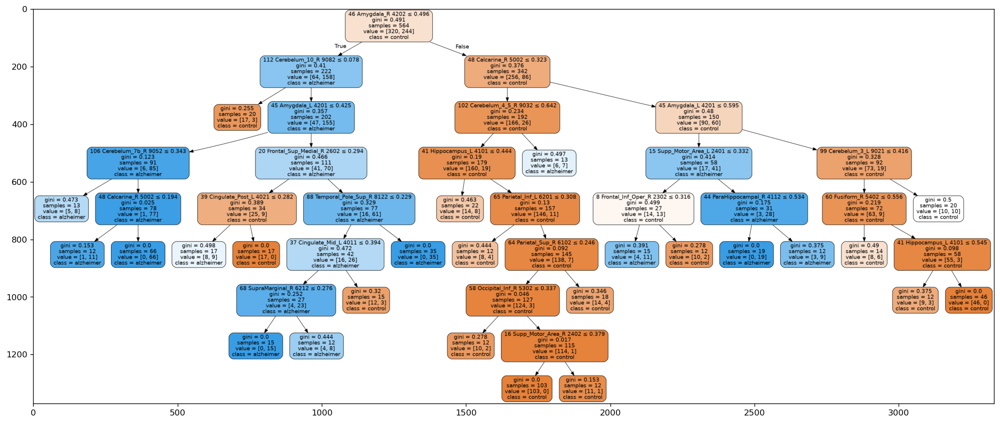

In [16]:
X_train_temp=np.copy(X_train)
for i in range(X_train.shape[0]):
    X_train_temp[i] = np.abs(X_train_temp[i] + np.random.normal(0, 0.05)) # The data is only positive
Tree.fit(X_train_temp, y_train)
dot_data = tree.export_graphviz(Tree, out_file=None,feature_names=labels,class_names=class_names,filled=True, rounded=True,special_characters=True)
graph = graphviz.Source(dot_data)
showGraph(graph)

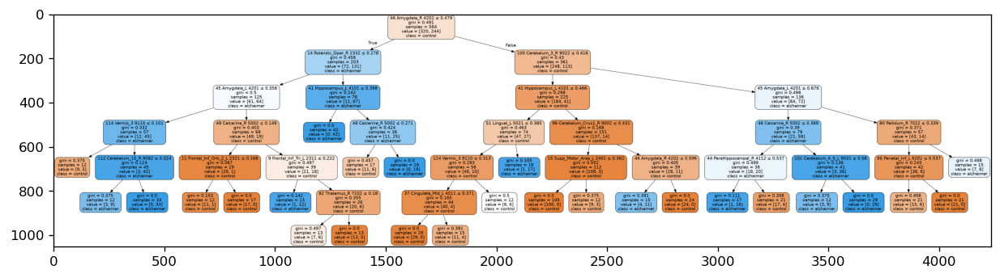

In [17]:
for i in range(X_train.shape[0]):
    X_train_temp[i] = np.abs(X_train_temp[i] + np.random.normal(0, 0.1)) # The data is only positive
Tree.fit(X_train_temp, y_train)
dot_data = tree.export_graphviz(Tree, out_file=None,feature_names=labels,class_names=class_names,filled=True, rounded=True,special_characters=True)
graph = graphviz.Source(dot_data)
showGraph(graph)


(eog:13259): EOG-CRITICAL **: 14:15:32.236: eog_image_get_file: assertion 'EOG_IS_IMAGE (img)' failed

(eog:13259): GLib-GIO-CRITICAL **: 14:15:32.237: g_file_equal: assertion 'G_IS_FILE (file1)' failed

(eog:13259): EOG-CRITICAL **: 14:15:32.237: eog_image_get_file: assertion 'EOG_IS_IMAGE (img)' failed

(eog:13259): GLib-GIO-CRITICAL **: 14:15:32.237: g_file_equal: assertion 'G_IS_FILE (file1)' failed

(eog:13259): EOG-CRITICAL **: 14:15:32.789: eog_job_thumbnail_cb: assertion 'EOG_IS_LIST_STORE (data)' failed


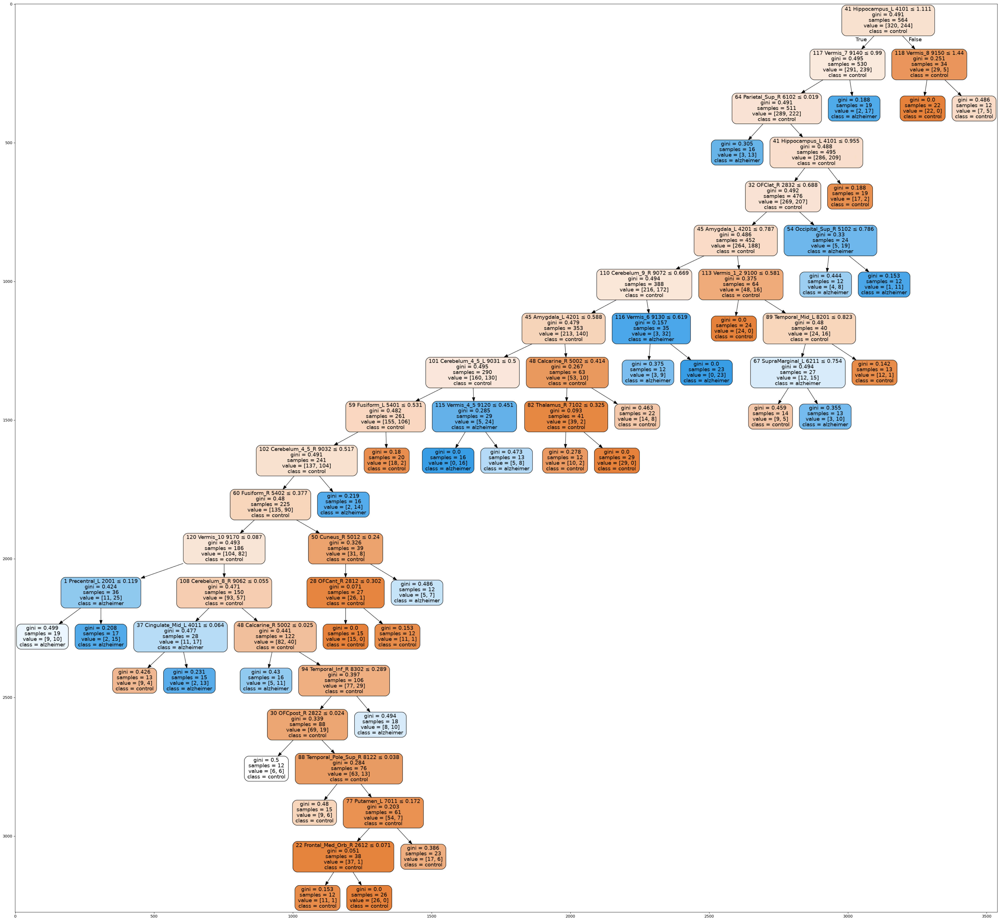

In [18]:
for i in range(X_train.shape[0]):
    X_train_temp[i] = np.abs(X_train_temp[i] + np.random.normal(0, 0.4)) # The data is only positive
Tree.fit(X_train_temp, y_train)
dot_data = tree.export_graphviz(Tree, out_file=None,feature_names=labels,class_names=class_names,filled=True, rounded=True,special_characters=True)
graph = graphviz.Source(dot_data)
showGraph(graph)

Instead than using a single split of the data, we could also use Cross Validation to compute the best hyperparameter values for both 'min_samples_split' and 'min_samples_leaf' at the same time and in an automatic way. 

**Question:** Do you find the same optimal hyperparameters as before ? Hint: use GridSearchCV

**Question**: So far, we have used the standard score (ie accuracy). Would you use a different one ? If yes, which one and why ?

**Answer:** Using the GridSearch I didn't arrive to the same result. This was pretty much expected since we had different
results for different splits of the dataset, as so, it was not probable to find the best params with a random split. With the cross-validation methods we were able to calculate a mean for different splits and arrive to less unbiased (according to the split) params

**Answer:** Yes, I would use recall since here I want to penalize more the false negatives, cause they generally cause bigger problems in disease diagnosis. Accuracy would pretty much work well too since our dataset is kind of balanced.

In [19]:
Tree = DecisionTreeClassifier()
p_grid_tree = {'min_samples_split': np.arange(2, 16),
              'min_samples_leaf': np.arange(2, 16)}
grid_tree = grid_tree = GridSearchCV(estimator=Tree, param_grid=p_grid_tree, cv=5,scoring="recall")
grid_tree.fit(X_train, y_train)
print("Best Validation Score: {}".format(grid_tree.best_score_))
print("Best params: {}".format(grid_tree.best_params_))
print("Tree test score :",grid_tree.score(X_test, y_test))

best_params=grid_tree.best_params_

Best Validation Score: 0.7748299319727892
Best params: {'min_samples_leaf': 11, 'min_samples_split': 12}
Tree test score : 0.75


Using the estimated optimal hyperparameers, plot the new decision tree using the *graphviz* library. 

**Question**: Is it the same as before? Do you see ROIs that are always close to the root of the tree among the different experiments ? If yes, what does it mean in your opinion ? Comment the results.

**Answer:** Yes, we can see that independently of the hyperparameters we generally see the Amygdala, Cerebelum and Hippocampus on the top of the tree meaning that these are important in the decision tree to evaluate an Alzheimer.

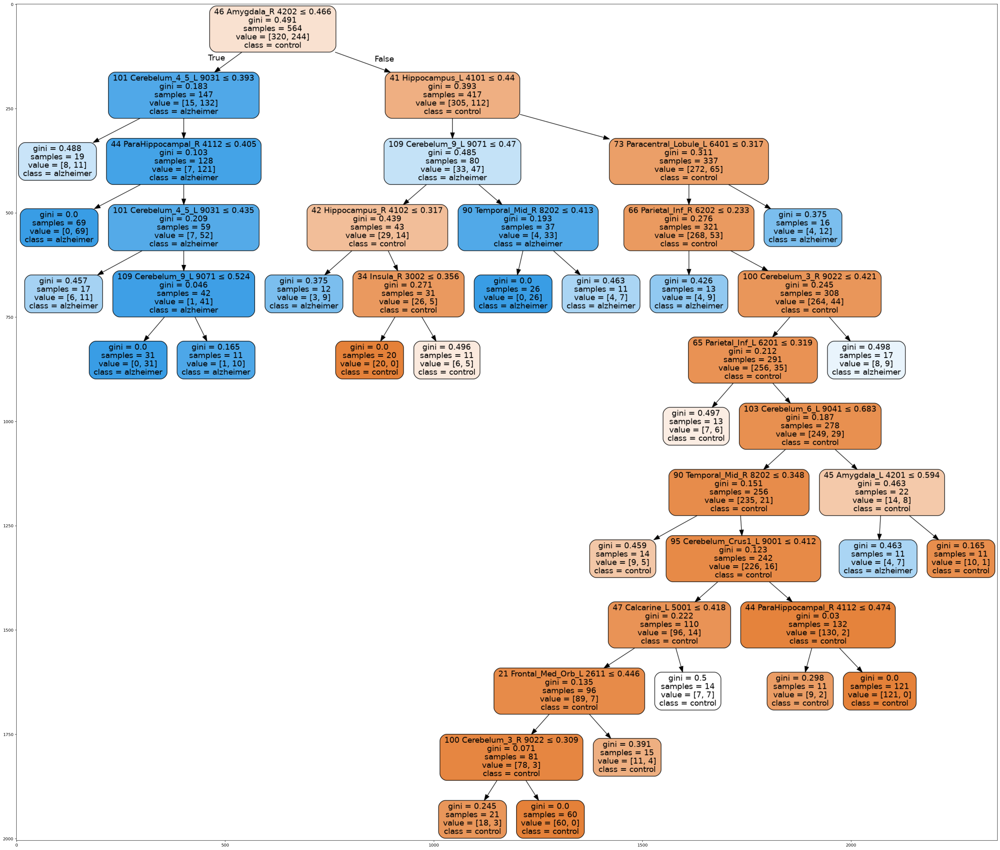

In [20]:
Tree = DecisionTreeClassifier(min_samples_split=best_params['min_samples_split'],min_samples_leaf=best_params['min_samples_leaf'],random_state=0)
Tree.fit(X_train,y_train)
dot_data = tree.export_graphviz(Tree, out_file=None,feature_names=labels,class_names=class_names,filled=True, rounded=True,special_characters=True)
graph = graphviz.Source(dot_data)
showGraph(graph)

Try to use now Bagging. You can use the following code where we use the previously computed best parameters 'min_samples_leaf' and 'min_samples_split'. 

**Question**: What happens when you use the original data and the noisy version ? Do you notice any difference in the prediction scores with respect to the results using Decision Trees ? 

**Answer:** The prediction scores becames more stable after using the bagging. Also, the noise does not affect that much the model scores as before

In [21]:
Tree = DecisionTreeClassifier(min_samples_leaf=best_params["min_samples_leaf"],min_samples_split=best_params["min_samples_split"], random_state=0)

p_grid_bagging = {'n_estimators': [5,10,15,20]}      
bag=BaggingClassifier(estimator=Tree, random_state=0)
grid_bagging = GridSearchCV(estimator=bag, param_grid=p_grid_bagging, scoring="f1")
grid_bagging.fit(X_train, y_train)
print("Best Validation Score: {}".format(grid_bagging.best_score_))
print("Best params: {}".format(grid_bagging.best_params_))
print("Bagging test score :",grid_bagging.score(X_test, y_test))

Best Validation Score: 0.767296351824088
Best params: {'n_estimators': 10}
Bagging test score : 0.7796610169491526


In [22]:
# Bagging on noisy data
Tree = DecisionTreeClassifier(min_samples_leaf=best_params["min_samples_leaf"],min_samples_split=best_params["min_samples_split"], random_state=0)

X_train_temp=np.copy(X_train)
for i in range(X_train.shape[0]):
    X_train_temp[i] += np.abs(np.random.normal(0, 0.05))

p_grid_bagging = {'n_estimators': [5,10,15,20]}      
bag=BaggingClassifier(estimator=Tree, random_state=0)
grid_bagging = GridSearchCV(estimator=bag, param_grid=p_grid_bagging, cv=5,scoring="f1")
grid_bagging.fit(X_train_temp,y_train)
print("Best Validation Score: {}".format(grid_bagging.best_score_))
print("Best params: {}".format(grid_bagging.best_params_))
print("Bagging test score :",grid_bagging.score(X_test,y_test))

Best Validation Score: 0.7328694245829077
Best params: {'n_estimators': 20}
Bagging test score : 0.8131868131868132


The last part of this TP is about Random Forests. We can estimate the three hyperparameters *'n_estimators'*, *'min_samples_leaf'* and *'max_features'*, the number of features to consider when looking for the best split, as before using Cross Validation

In [24]:
RF=RandomForestClassifier(random_state=0)
p_grid_RF = {'n_estimators': [10,15,20,25,30], 'min_samples_leaf': [2,3,4,5,6], 'max_features': ['sqrt','log2']}   

grid_RF = GridSearchCV(estimator=RF, param_grid=p_grid_RF, scoring='f1', cv=5)
grid_RF.fit(X_train, y_train)

print("Best Validation Score: {}".format(grid_RF.best_score_))
print("Best params: {}".format(grid_RF.best_params_))
print("Random Forest test score :",grid_RF.score(X_test, y_test))

Best Validation Score: 0.7968628146047501
Best params: {'max_features': 'log2', 'min_samples_leaf': 3, 'n_estimators': 30}
Random Forest test score : 0.7719298245614035


Using the estimated best hyperparameters, test the performance of Random Forest on the noisy data and compare the results with Decision Trees and Bagging. 

In [26]:
# Random Forest on noisy data
X_train_temp=np.copy(X_train)
for i in range(X_train.shape[0]):
    X_train_temp[i] = np.abs(X_train_temp[i] + np.random.normal(0, 0.05))

RF=RandomForestClassifier(max_features=grid_RF.best_params_['max_features'],min_samples_leaf=grid_RF.best_params_['min_samples_leaf'],n_estimators=grid_RF.best_params_['n_estimators'],random_state=0)
RF.fit(X_train_temp,y_train)
# Score in the training set
print('Score in the training set is {0}'.format(RF.score(X_train,y_train)) )
# Score in the test set
print('Score in the test set is {0}'.format(RF.score(X_test,y_test)) )

Score in the training set is 0.849290780141844
Score in the test set is 0.7872340425531915


We can also use Random Forests to check the importance of the features

Feature ranking:
1. feature 44 representing 45 Amygdala_L 4201
 (0.061224)
2. feature 43 representing 44 ParaHippocampal_R 4112
 (0.058600)
3. feature 45 representing 46 Amygdala_R 4202
 (0.057451)
4. feature 40 representing 41 Hippocampus_L 4101
 (0.055254)
5. feature 92 representing 93 Temporal_Inf_L 8301
 (0.031908)
6. feature 41 representing 42 Hippocampus_R 4102
 (0.025698)
7. feature 93 representing 94 Temporal_Inf_R 8302
 (0.022938)
8. feature 86 representing 87 Temporal_Pole_Sup_L 8121
 (0.021833)
9. feature 42 representing 43 ParaHippocampal_L 4111
 (0.020772)
10. feature 59 representing 60 Fusiform_R 5402
 (0.017471)


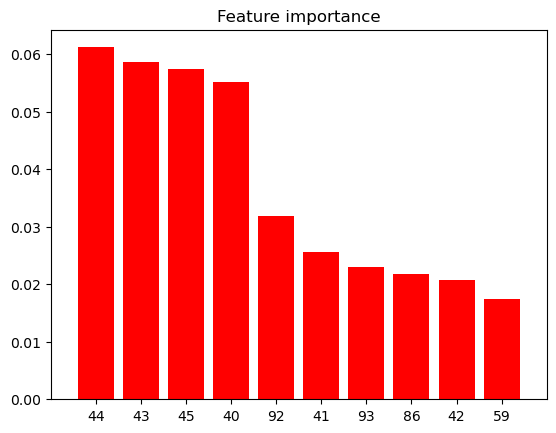

In [27]:
best_params=grid_RF.best_params_
RF = RandomForestClassifier(min_samples_leaf=best_params["min_samples_leaf"],max_features=best_params["max_features"],n_estimators=best_params["n_estimators"], random_state=0)
RF.fit(X_train,y_train)

importances = RF.feature_importances_
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(10):
    print("%d. feature %d representing %s (%f)" % (f + 1, indices[f], labels[indices[f]], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importance")
plt.bar(range(10), importances[indices[0:10]], color="r", align="center")
plt.xticks(range(10), indices[0:10])
plt.xlim([-1, 10])
plt.show()

**Question**: Which are the most important features (i.e. ROIs) ?  Based on the two given research papers, you can verify if your results make sense. 

The most important features are the amygdala and hippocampus. The papers suggest the importance of the markes on the hippocampus atrophy and also of the amygdala, although for the amygdala they suggest that is actually difficult to aquire the data based on image processing techniques. So yes, it makes sense.

We can also inspect the data using only pairs of the most important features

/tmp/ipykernel_12304/3039693479.py:40: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(Xpair[idx, 0], Xpair[idx, 1], c=color, label=class_names[i],
/tmp/ipykernel_12304/3039693479.py:40: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(Xpair[idx, 0], Xpair[idx, 1], c=color, label=class_names[i],
/tmp/ipykernel_12304/3039693479.py:40: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(Xpair[idx, 0], Xpair[idx, 1], c=color, label=class_names[i],
/tmp/ipykernel_12304/3039693479.py:40: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(Xpair[idx, 0], Xpair[idx, 1], c=color, label=class_names[i],
/tmp/ipykernel_12304/3039693479.py:40: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(Xpair[idx, 0], Xpair[idx, 1], c=color, la

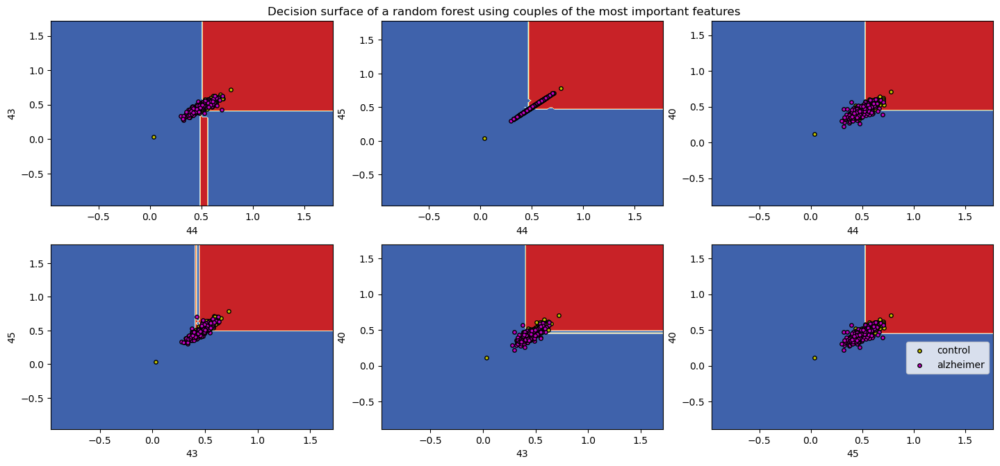

The best combination pair was: 
 45. feature 30 representing 31 OFClat_L 2831
 (0.006464)
 46. feature 101 representing 102 Cerebelum_4_5_R 9032
 (0.006415)


In [44]:
plt.figure(figsize=(15,7))
scores = []
pairs = np.array([ [indices[0],indices[1]], [indices[0],indices[2]], [indices[0],indices[3]],
                                [indices[1],indices[2]], [indices[1],indices[3]], [indices[2],indices[3]] ])
for pairidx, pair in enumerate(pairs):
    # We only take the two corresponding features
    Xpair = X_train[:, pair]
    ypair = y_train

    X_test_pair = X_test[:, pair]
    y_test_pair = y_test

    # Train
    clf = RF.fit(Xpair, ypair)

    # Plot the decision boundary
    plt.subplot(2, 3, pairidx + 1)
    
    x_min, x_max = Xpair[:, 0].min() - 1, Xpair[:, 0].max() + 1
    y_min, y_max = Xpair[:, 1].min() - 1, Xpair[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.02),
                         np.arange(y_min, y_max, 0.02))
    
    plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)

    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=plt.cm.RdYlBu)

    score = clf.score(X_test_pair, y_test_pair)
    scores.append(score)


    plt.xlabel(pair[0])
    plt.ylabel(pair[1])

    # Plot the training points
    for i, color in zip(range(2), "ym"):
        idx = np.where(ypair == i)
        plt.scatter(Xpair[idx, 0], Xpair[idx, 1], c=color, label=class_names[i],
                    cmap=plt.cm.RdYlBu, edgecolor='black', s=15)

plt.suptitle("Decision surface of a random forest using couples of the most important features")
plt.legend(bbox_to_anchor=(1, 0.5))
plt.axis("tight")
plt.show()
best_pair = pairs[np.argmin(scores)]
print("The best combination pair was: \n %d. feature %d representing %s (%f)" % (best_pair[0] + 1, indices[best_pair[0]], labels[indices[best_pair[0]]], importances[indices[best_pair[0]]]) + "\n %d. feature %d representing %s (%f)" % (best_pair[1] + 1, indices[best_pair[1]], labels[indices[best_pair[1]]], importances[indices[best_pair[1]]]))

**Question**: Which is the best couple of features ?

As seen in the completed code above the best combination of features was 45 and 46

**Different Atlas**

Previously, we have used the AAL2 which defines a precise split of the brain into ROIs. What happens if you change Atlas ? Do you obtain the same results ? Can you find a subset of ROIs that you could define 'biomarkers' of the Alzheimer's disease ? Justify your answer and check whether it makes sense by using the two given research papers.

You can use the AICHA (http://www.gin.cnrs.fr/fr/outils/aicha/) and HAMMERS (https://brain-development.org/brain-atlases/adult-brain-atlases/) atlas.

We can that for the HAMMERS Atlas we had results a bit similar which the amygdala and hippocampus appear as important features while for the AICHA we saw some different features such as Thalamus and Caudate although the Parahippocampus was also present in the top 10 features. Also, this result is reasonable since the image data processing for extractiong features are probably different for different Atlas, and as so some features assume more importance and also the features pointed as relevant in the AICHA atlas (Thalamus and Caudate) were also cited in the papers as ROIs.

Number of controls and Alzheimer patients is respectively: 416.0 and 336.0
Number of ROI (features) is: 68


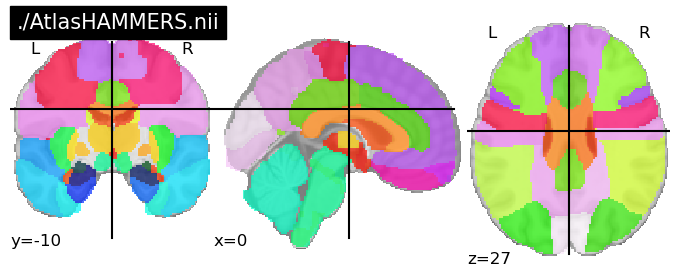

In [67]:
# Choose Atlas (here AAL2)
CHOICE = "HAMMERS"



CHOICES = [["AAL2", "AICHA", "HAMMERS"],
          [T1AAL2, T1AICHA, T1HAMMERS],
          [ROIlabelsAAL2, ROIlabelsAICHA, ROIlabelsHAMMERS],
          ["./AtlasAAL2.nii", "./AtlasAICHA.nii", "./AtlasHAMMERS.nii"]]

index = CHOICES[0].index(CHOICE)

X=CHOICES[1][index] # T1AAL2, T1AICHA, T1HAMMERS
labels=CHOICES[2][index] # ROIlabelsAAL2, ROIlabelsAICHA, ROIlabelsHAMMERS
atlas=CHOICES[3][index] #AtlasAAL2.nii, AtlasAICHA.nii, AtlasHAMMERS.nii

N,M = X.shape # number subjects and ROIs
class_names = ["control","alzheimer"] # y=0, y=1

print('Number of controls and Alzheimer patients is respectively: {0} and {1}'.format(N-np.sum(y), np.sum(y)))
print('Number of ROI (features) is: {0}'.format(M))
plotting.plot_roi(atlas, title=atlas)
plotting.show()

0.0


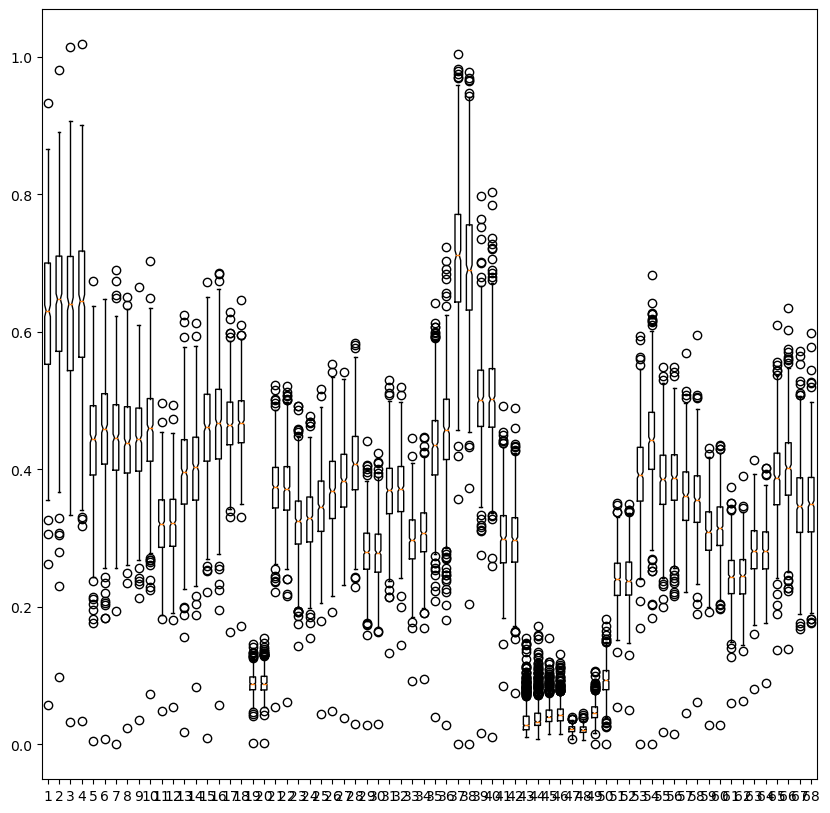

In [68]:
# Create training and test set
X_train, X_test, y_train, y_test = train_test_split(X, np.ravel(y), test_size=0.25)
plt.figure(figsize=(10,10))
plt.boxplot(X,notch=True);

print(np.min(X)) # Since this value is non-negative we will only normalize.
# Otherwise (if it had negative values) we would need to standardize
# The standadiation allows us to have neg values, it just performs z = (x - u)/sigma
# Normalization keeps it between 0 and 1 (MinMaxScaler)
# Standardization/Normalization

from sklearn.preprocessing import StandardScaler, MinMaxScaler

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [69]:
RF=RandomForestClassifier(random_state=0)
p_grid_RF = {'n_estimators': [10,15,20,25,30], 'min_samples_leaf': [2,3,4,5,6], 'max_features': ['sqrt','log2']}   

grid_RF = GridSearchCV(estimator=RF, param_grid=p_grid_RF, scoring='f1', cv=5)
grid_RF.fit(X_train, y_train)

print("Best Validation Score: {}".format(grid_RF.best_score_))
print("Best params: {}".format(grid_RF.best_params_))
print("Random Forest test score :",grid_RF.score(X_test, y_test))

Best Validation Score: 0.7800009247414579
Best params: {'max_features': 'log2', 'min_samples_leaf': 6, 'n_estimators': 30}
Random Forest test score : 0.7953216374269005


Feature ranking:
1. feature 3 representing Right Amygdala                         (0.104163)
2. feature 0 representing Left Hippocampus                       (0.060317)
3. feature 2 representing Left Amygdala                          (0.056700)
4. feature 46 representing Left Lateral Temporal Ventricle        (0.056522)
5. feature 4 representing Left Anterior Medial Temporal Lobe     (0.044232)
6. feature 47 representing Right Lateral Temporal Ventricle       (0.043135)
7. feature 1 representing Right Hippocampus                      (0.042889)
8. feature 12 representing Left Inferior Middle Temporal Gyri     (0.042807)
9. feature 45 representing Right Corpus Callosum                  (0.025614)
10. feature 8 representing Left Ambient and Parahippocampus Gyri  (0.024552)


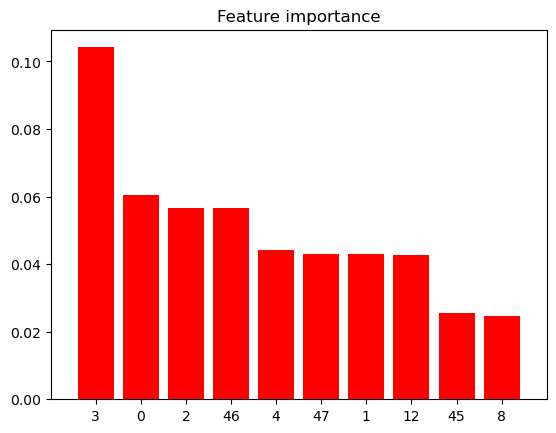

In [70]:
best_params=grid_RF.best_params_
RF = RandomForestClassifier(min_samples_leaf=best_params["min_samples_leaf"],max_features=best_params["max_features"],n_estimators=best_params["n_estimators"], random_state=0)
RF.fit(X_train,y_train)

importances = RF.feature_importances_
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(10):
    print("%d. feature %d representing %s (%f)" % (f + 1, indices[f], labels[indices[f]], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importance")
plt.bar(range(10), importances[indices[0:10]], color="r", align="center")
plt.xticks(range(10), indices[0:10])
plt.xlim([-1, 10])
plt.show()